# 45th solution for Intel & MobileODT Cervical Cancer Screening challenge

## Which cancer treatment will be most effective?

We took part in challenge on platform kaggle. Our task was to classify images to three categories of cervix. All of them are considered normal (not cancerous) but some of them need more testing as their cases are harder to examine. This problem seems to be difficult even for educated doctors. Results of this challenge were supposed to be used for automatic system to fast and correctly categorise the cervix types. Differences between types are described on the image below.
<img src="cervix.png">

In our opinion differences between those three types are really small and hard to notice.

In [1]:
import pandas as pd
import numpy as np
import keras
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
from sklearn.cluster import KMeans

from data_preprocessing import preprocess_one_image
# from kmeans_validation import compute_histograms
# Disable DeprecationWarnings which may be irritating.
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

Using TensorFlow backend.


In [2]:
def compute_histogram(img, hist_size=100):
    hist = cv2.calcHist([img], [0], mask=None, histSize=[hist_size], ranges=(0, 255))
    hist = cv2.normalize(hist, dst=hist)
    return hist

## Data and data preprocessing 

The data was received in three packages: the training, the additional and the test set.
The images in the training set were organized in three labeled categories of the cervix type: 
* Type 1 - 250 images
* Type 2 - 781 images
* Type 3 - 450 images

The additional set included more cervix images, some of which were of inferior quality or came from duplicated patients.

All 511 of images in the test set came up labelless and shuffled into the same folder. To classify these images into aforementioned 3 categories was the goal of the whole challenge.

The first step in preprocessing images was to remove the circle. The photo was divided into two areas - in this way the circle contour was found. On this circle was drawn a rectangle and thus cropped the picture.

The second step was to find the most important part of the photo. The biggest problem was that it was not always in the middle of the image. For this, a Gaussian Mixture Model was used. Additionally, changing the RGB to a grayscale, setting the appropriate threshold and finding the contour allowed a very good approximation of an important part of the image.

All cropped photos have been reduced to 224x224 pixels.

We used approach from https://www.kaggle.com/chattob/cervix-segmentation-gmm

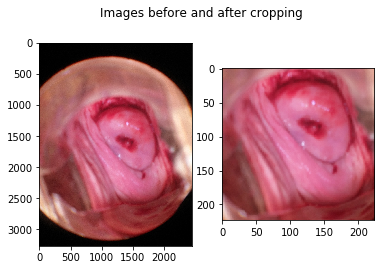

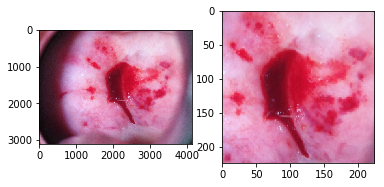

In [3]:
# This part is quite expensive. It can take a few minutes to compute it. To preprocess
# all images from training and test sets it is convenient to use preprocess_all_data.py script.
DATA_PATH = '/home/maciej/intel/data/'

img = plt.imread(DATA_PATH + 'raw_data/train/Type_1/0.jpg')
# tile_size make the computation faster, smaller - faster and worser (quality)
img_preprocessed = preprocess_one_image(DATA_PATH + 'raw_data/train/Type_1/0.jpg', 
                                        tile_size=(1024, 1024)) 
img1 = plt.imread(DATA_PATH + 'raw_data/train/Type_2/1006.jpg')
img1_preprocessed = preprocess_one_image(DATA_PATH + 'raw_data/train/Type_2/1006.jpg',
                                        tile_size=(1024, 1024))
plt.figure()
plt.suptitle('Images before and after cropping')
plt.subplot(121)
plt.imshow(img)
plt.subplot(122)
plt.imshow(img_preprocessed)
plt.figure()
plt.subplot(121)
plt.imshow(img1)
plt.subplot(122)
plt.imshow(img1_preprocessed)
plt.show()

### Validation - the most important task in this challenge

Our validation was done with simple train_test_split from sklearn. To avoid overfitting and not validating on images that our model have seen during training we did not use additional data with duplicates. We divided the set into 4 groups using KMeans.

However the winners used additional data and have some special validation which was the only thing it differs from another solutions. They computed KMeans with number of clusters set to 100 on histograms of images and took about 15 clusters to validation set and the rest to training set. Doing that they avoided overfitting and have solid validation. Example of clusters are shown below.

In [4]:
X_train = pd.read_pickle(DATA_PATH + 'pikle/X_train')
X_additional = np.load(DATA_PATH + 'pikle/X_additional.npy')
X_all = np.concatenate([X_train, X_additional])

y_train = pd.read_pickle(DATA_PATH + 'pikle/y_train')
y_additional = np.load(DATA_PATH + 'pikle/y_additional.npy')
y_all = np.concatenate([y_train, y_additional])

hist_size = 100
X = np.zeros((X_all.shape[0], 3*hist_size), dtype=np.float32)

print "Computing histograms..."
for i in range(X_all.shape[0]):

    img = X_all[i,:,:,:]


    proc = cv2.GaussianBlur(img.copy(), (7, 7), 0)
    hsv = cv2.cvtColor(proc, cv2.COLOR_RGB2HSV)
    hue = hsv[:,:,0]
    sat = hsv[:,:,1]
    val = hsv[:,:,2]

    hist_hue = compute_histogram(hue, hist_size)
    hist_sat = compute_histogram(sat, hist_size)    
    hist_val = compute_histogram(val, hist_size)
    X[i, 0:hist_size] = hist_hue[:,0]
    X[i, hist_size:2*hist_size] = hist_sat[:,0]
    X[i, 2*hist_size:] = hist_val[:,0] 
print "Done"

Computing histograms...
Done


In [5]:
kmeans = KMeans(n_clusters=100)
labels = kmeans.fit_predict(X)

In [6]:
image_size = (256, 256)

In [7]:
def show_images(images, cols = 1, titles = None):
    """Display a list of images in a single figure with matplotlib.
    
    Parameters
    ---------
    images: List of np.arrays compatible with plt.imshow.
    
    cols (Default = 1): Number of columns in figure (number of rows is 
                        set to np.ceil(n_images/float(cols))).
    
    titles: List of titles corresponding to each image. Must have
            the same length as titles.
    """
    assert((titles is None)or (len(images) == len(titles)))
    n_images = len(images)
    if titles is None: titles = ['Image (%d)' % i for i in range(1,n_images + 1)]
    fig = plt.figure()
    for n, (image, title) in enumerate(zip(images, titles)):
        a = fig.add_subplot(cols, np.ceil(n_images/float(cols)), n + 1)
        if image.ndim == 2:
            plt.gray()
        plt.imshow(image/255.)
        a.set_title(title)
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_images)
    plt.show()

#### Example images from the different clusters

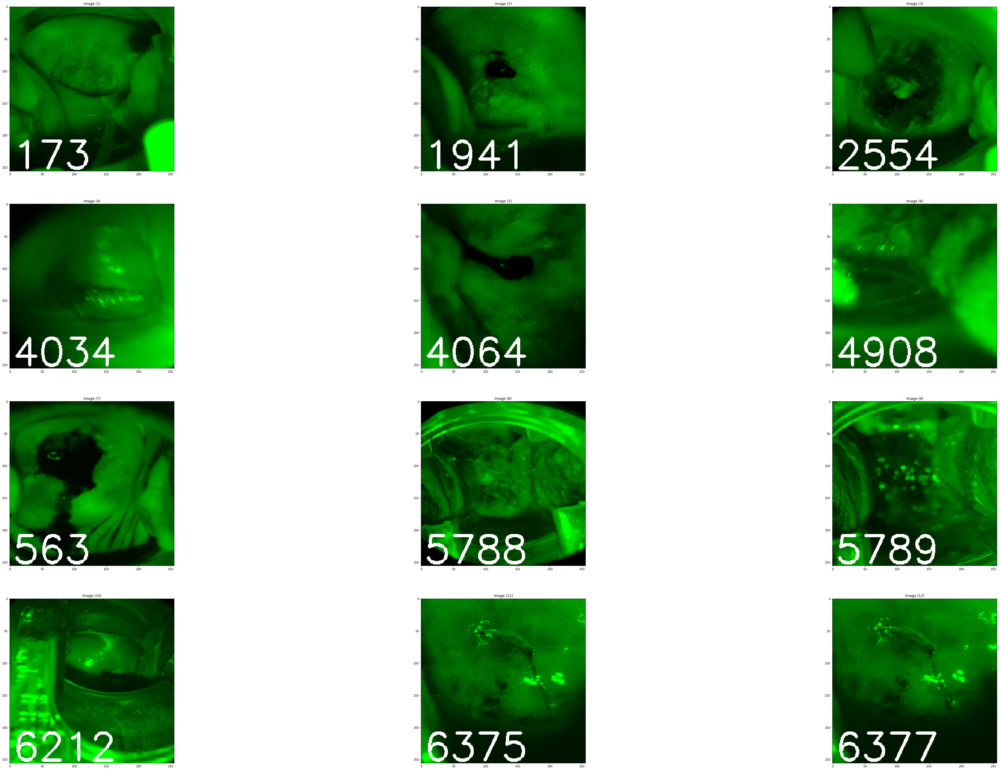

In [8]:
show_images(X_all[labels == 88][:12], cols=4)

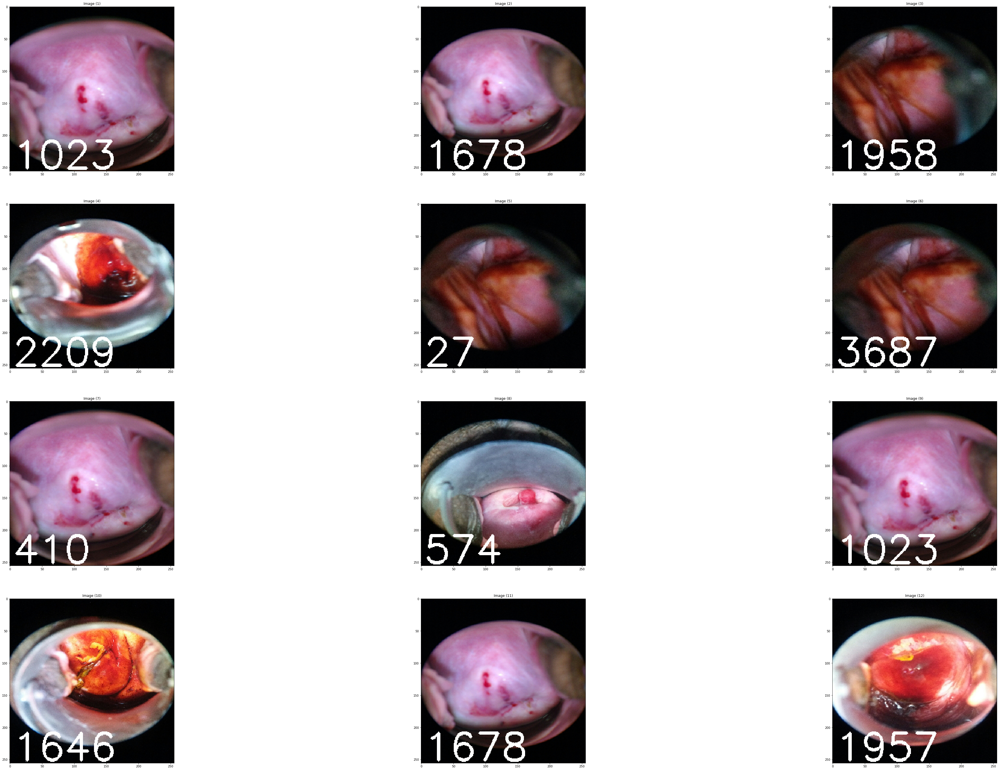

In [9]:
show_images(X_all[labels == 71][:12], cols=4)

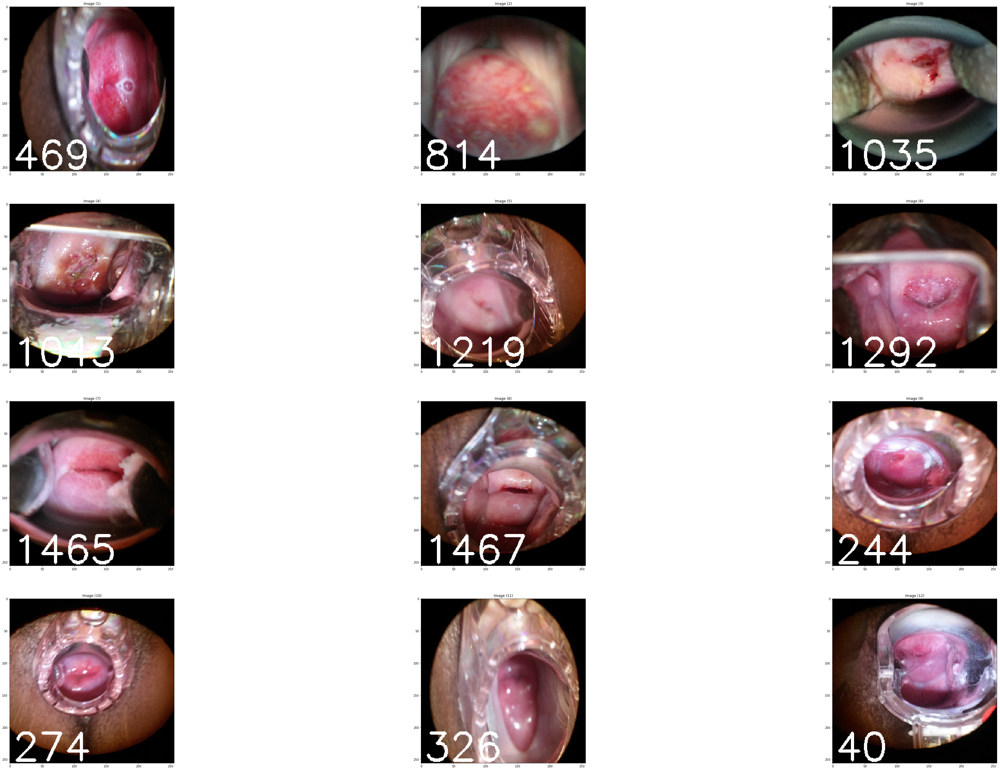

In [10]:
show_images(X_all[labels == 34][:12], cols=4)

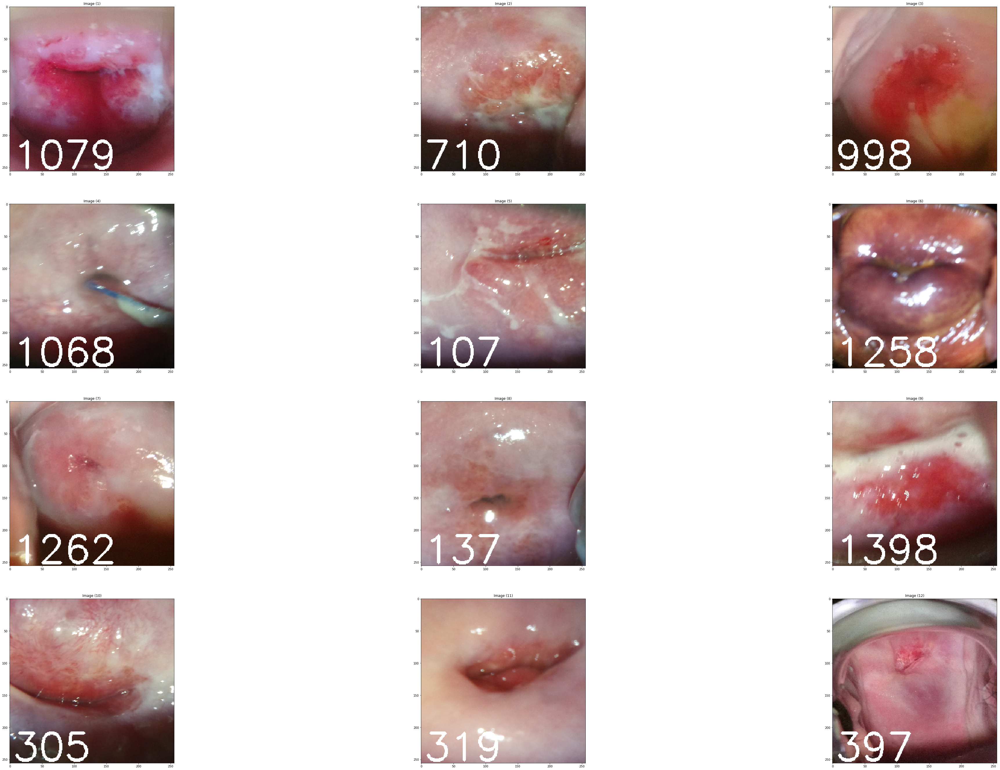

In [11]:
show_images(X_all[labels == 27][:12], cols=4)

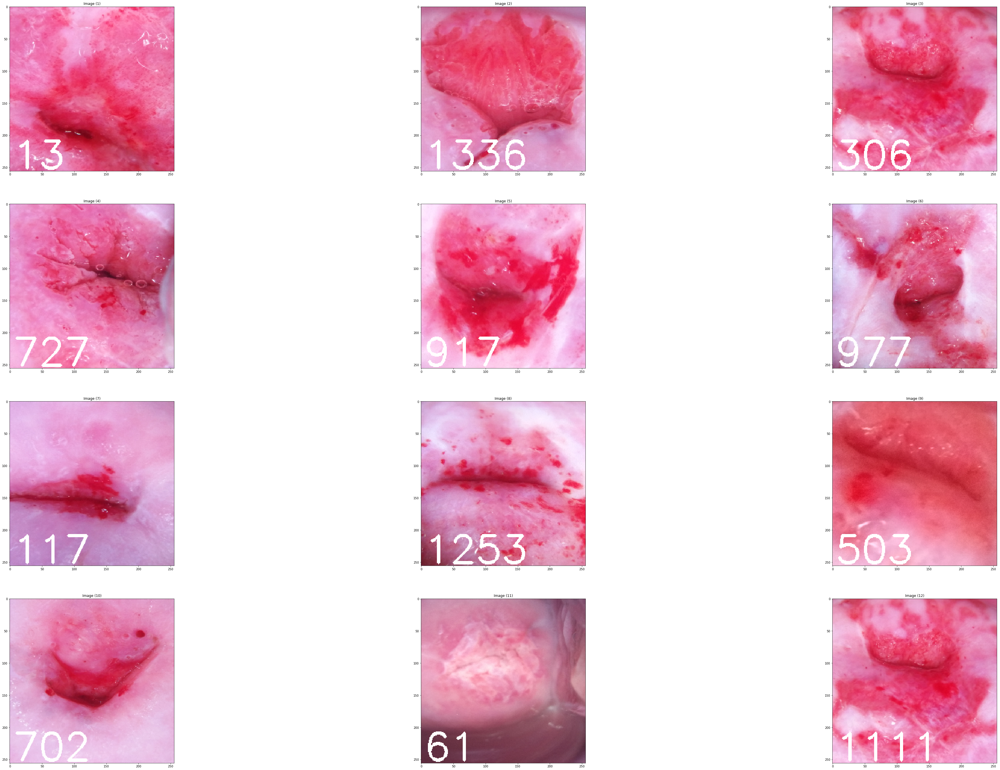

In [12]:
show_images(X_all[labels == 13][:12], cols=4)

In [13]:
X_val = X_all[labels < 15]
y_val = y_all[labels < 15]
X_train = X_all[labels >= 15]
y_train = y_all[labels >= 15]

## Model - convolutional neural networks

Nowadays, many researchers use convolutional neural networks (CNN) for biomedical image classification. This method was made to process images as it was slightly inspired by human visual system. Algorithms based on CNN perform better than older approaches and are the state of the art models in computer vision. During this challenge we tested many hypothesis connected with applications of machine learning algorithms in classification of biomedical images.

Our first approach was simple neural net with 4 convolutional layers with rectified linear activations and max pooling between pairs of convolutions. Before output layer we added dropout with half of neurons switched off during training. We scored about 0.85 log loss on the public leaderboard.

Then we decided to try transfer learning which is using pre-trained models on big dataset to resolve different problem that it was originally trained ([How transferable are features in deep neural networks?](https://arxiv.org/abs/1411.1792), [Stanford deep learning course](http://cs231n.github.io/transfer-learning/#tf)). We used models trained on ImageNet dataset which contains about one million images of people, animals and a variety of things. We can easily say that ImageNet images are different than photographies of cervixes however this approach works mainly because first layers recognize simple shapes and local connections between pixels. It can be named as general structures detectors. Additionally dataset with cervixes was quite small, so learning general filters could result in overfitting.
We tried some pre-trained models: [VGG16](https://arxiv.org/abs/1409.1556), [InceptionV3](https://arxiv.org/abs/1512.00567), [ResNet50](https://arxiv.org/abs/1512.03385) and [Xception](https://arxiv.org/abs/1610.02357) from keras applications [keras.application](https://keras.io/applications/). Till the end of the challenge we tried many hypothesis and all of them were using transfer learning. 

To summarize the transfer learning method, we took pre-trained model on ImageNet and cut last 3-6 layers. Then we added one convolution layer with 512 filters and kernel size 3x3 and one fully connected layers with 512 neurons. Before applying softmax function we inserted dropout with fraction of input units to drop set to 0.25. Next we trained net with frozen weights in base model layers. After that we ran second training with all layers trainable. We used [Adam optimizer](https://arxiv.org/abs/1412.6980) and Stochastic Gradient Descent (SGD) to rain nets. We were stopping training when results on validation set get worse in 5 epochs. It was the core of our project. We made some modifications to check our ideas.
We made stacking on models listed above using [XGBoost](https://arxiv.org/abs/1603.02754) but it has strongly overfitted and our results on public leaderboard did not beat the best score from InceptionV3 (0.73). We tried also simpler approach with ensembling and count the probability of each class as mean from probabilities given by trained models. It gave us some  profit - log loss about 0.70.

One more idea was to use additional targets so the net should learn and try to predicts more labels. On our case it was shape of the bloody area of the cervix. We supposed that suggesting where the most important part of the image is could heplful and improve results. Unfortunately it has no positive effect.

Another approach was cutting the histograms of images during first training epochs to remove some outlier pixels and stop net from spending many filters to learn patterns connected with outliers. Once again we could not achieve any better results.
All the time we were not using additional data, so we were hoping that our models were not overfitted.



In [14]:
from train_net import train_model,test_augmentation
from keras.applications import InceptionV3
from keras.layers import Conv2D, GlobalMaxPooling2D, Dense, Dropout
from keras.models import Model

In [15]:
# Definition of model we will train
base_model = InceptionV3(include_top=False, weights='imagenet',
                         input_tensor=None,
                         input_shape=(224, 224, 3), classes=3)
x = base_model.output
x = Conv2D(512, (3, 3))(x)
x = GlobalMaxPooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.25)(x)
predictions = Dense(3, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

for layer in model.layers[:-5]:
    layer.trainable = False
    
model.compile(
        optimizer=keras.optimizers.sgd(lr=0.001, momentum=0.9, nesterov=True),
        loss='categorical_crossentropy')
# First training with only 5 layers trainable
model, datagen = train_model(model=model, batch_size=32, num_classes=3, epochs=40, data_augmentation=True,
                             model_name='example.hdf5', 
                             X_train_train=X_train[:, 16:240, 16:240, :], 
                             y_train_train=y_train,
                             X_test_train=X_val[:, 16:240, 16:240, :], 
                             y_test_train=y_val)

for layer in model.layers[:-5]:
    layer.trainable = True

model.compile(optimizer=keras.optimizers.adam(lr=0.0001),
              loss='categorical_crossentropy')
# Second training with all layers trainable
model, datagen = train_model(model, 32, 3, 40, True, 'example.hdf5',
                             X_train_train=X_train[:, 16:240, 16:240, :], 
                             y_train_train=y_train,
                             X_test_train=X_val[:, 16:240, 16:240, :], 
                             y_test_train=y_val)

('x_train shape:', (6798, 224, 224, 3))
(6798, 'train samples')
(1349, 'test samples')
Using real-time data augmentation.
Epoch 1/40
212/212 [==============================] - 70s - loss: 1.0566 - val_loss: 0.9805
Epoch 2/40
212/212 [==============================] - 64s - loss: 0.9728 - val_loss: 0.9951
Epoch 3/40
212/212 [==============================] - 64s - loss: 0.9557 - val_loss: 0.9897
Epoch 4/40
212/212 [==============================] - 65s - loss: 0.9487 - val_loss: 0.9822
Epoch 5/40
212/212 [==============================] - 63s - loss: 0.9425 - val_loss: 0.9867
Epoch 6/40
212/212 [==============================] - 65s - loss: 0.9393 - val_loss: 0.9993
Epoch 7/40
212/212 [==============================] - 65s - loss: 0.9359 - val_loss: 0.9615
Epoch 8/40
212/212 [==============================] - 65s - loss: 0.9282 - val_loss: 0.9759
Epoch 9/40
212/212 [==============================] - 65s - loss: 0.9309 - val_loss: 0.9943
Epoch 10/40
212/212 [=============================

In [16]:
X_test_1st_stage = pd.read_pickle(DATA_PATH + 'wyciete_z_wiekszych_ostateczne/X_test_cut')
X_test_1st_stage_file_names = pd.read_pickle(DATA_PATH + 'wyciete_z_wiekszych_ostateczne/X_test_file_name')
y_test_true_labels_1st_stage = pd.read_csv(DATA_PATH + 'solution_stg1_release.csv')

In [17]:
X_test_sorted = []
for i in y_test_true_labels_1st_stage['image_name']:
    X_test_sorted.append(X_test_1st_stage[np.where(X_test_1st_stage_file_names == i[:-4])])
X_test_sorted = np.squeeze(np.array(X_test_sorted))

In [18]:
y_test_sorted = np.argmax(y_test_true_labels_1st_stage.iloc[:, 1:].values, 1)

In [19]:
preds = test_augmentation(model, datagen, X_test_sorted, n_iter=2)

Predictions are being computed...


train_net.py:84: UserWarning: Update your `predict_generator` call to the Keras 2 API: `predict_generator(<keras.pre..., 512, use_multiprocessing=True)`
  X.shape[0], pickle_safe=True))


In [20]:
from sklearn.metrics import accuracy_score, confusion_matrix, log_loss

In [21]:
print "Accuracy: {}".format(accuracy_score(y_test_sorted, np.argmax(preds, axis=1)))
print "Percentage of labels: ", np.unique(y_test_sorted, return_counts=True)[1]/512.
print "Percentage of preds: ", np.unique(np.argmax(preds, axis=1), return_counts=True)[1]/512.
print "Log loss: {}".format(log_loss(y_test_sorted, preds))
print "Confusion matrix: "
pd.DataFrame(confusion_matrix(y_test_sorted, np.argmax(preds, axis=1)), columns=['0', '1', '2'], index=[0, 1, 2])

Accuracy: 0.630859375
Percentage of labels:  [ 0.16992188  0.51757812  0.3125    ]
Percentage of preds:  [ 0.06445312  0.61132812  0.32421875]
Log loss: 0.821920354378
Confusion matrix: 


,0,1,2
0,21,59,7
1,12,198,55
2,0,56,104


### Checking which parts of images are the most important

Debugging neural nets is quite hard. We wanted to know which parts of images are responsible for predictions. To get this information we used [LIME - Local Interpretable Model-Agnostic](https://homes.cs.washington.edu/~marcotcr/blog/lime/) . Some images are shown below.

In [22]:
from lime import lime_image
from skimage.segmentation import mark_boundaries

[[ 0.22895293  0.50769043  0.2633566 ]] True label:  2


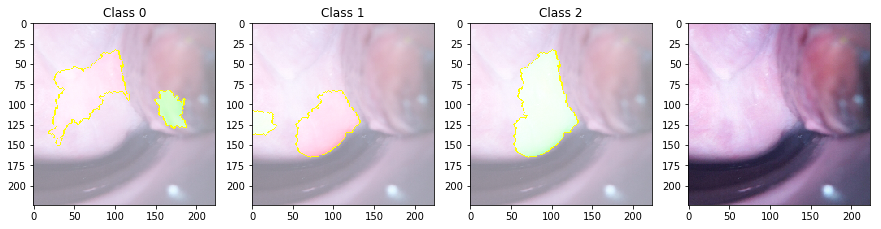

In [23]:
# index of image to display
ex = 15
explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(X_test_sorted[ex]/255., classifier_fn=model.predict,
                                        top_labels=3, hide_color=0)

plt.figure(figsize=(15,12))
plt.subplot(141)
plt.title('Class 0')
temp, mask = explanation.get_image_and_mask(0, positive_only=False, num_features=3, hide_rest=False,
                                           min_weight=0.000005)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
plt.subplot(142)
plt.title('Class 1')
temp, mask = explanation.get_image_and_mask(1, positive_only=False, num_features=3, hide_rest=False,
                                           min_weight=0.00000005)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
plt.subplot(143)
plt.title('Class 2')
temp, mask = explanation.get_image_and_mask(2, positive_only=False, num_features=3, hide_rest=False,
                                           min_weight=0.0000005)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

plt.subplot(144)
plt.imshow(X_test_sorted[ex]/255.)

print model.predict(X_test_sorted[ex:ex+1]/255.), "True label: ", y_test_sorted[ex]
# green parts tells model that image belongs to specific class(left image class 0), red parts tells model that
# it is not that class

(array([[ 0.2237352 ,  0.50913191,  0.26713291]], dtype=float32), 1)

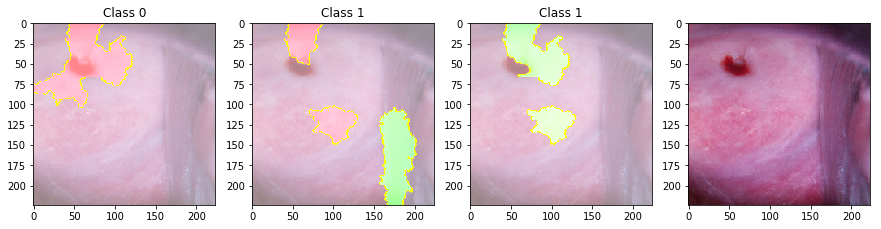

In [24]:
# index of image to display
ex = 8
explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(X_test_sorted[ex]/255., classifier_fn=model.predict,
                                        top_labels=3, hide_color=0)

plt.figure(figsize=(15,12))
plt.subplot(141)
plt.title('Class 0')
temp, mask = explanation.get_image_and_mask(0, positive_only=False, num_features=3, hide_rest=False,
                                           min_weight=0.000005)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
plt.subplot(142)
plt.title('Class 1')
temp, mask = explanation.get_image_and_mask(1, positive_only=False, num_features=3, hide_rest=False,
                                           min_weight=0.00000005)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
plt.subplot(143)
plt.title('Class 1')
temp, mask = explanation.get_image_and_mask(2, positive_only=False, num_features=3, hide_rest=False,
                                           min_weight=0.0000005)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

plt.subplot(144)
plt.imshow(X_test_sorted[ex]/255.)

model.predict(X_test_sorted[ex:ex+1]/255.), y_test_sorted[ex]
# green parts tells model that image belongs to specific class(left image class 0), red parts tells model that
# it is not that class

## Alternative methods

We were also actively researching alternative classification tools such as SVC (linear support vector classification), KNeighborsClassifier (k nearest neighbors classification) or RandomForestClassifier (decision tree classification) from the python sklearn.svm, sklearn.neighbors and sklearn.ensemble modules, respectively. Unfortunately, the results were not nearly as satisfying as our main neural network method.

## Summary

During the competition we tried many approaches. Most of them did not imporove performance of our models. However we can't say it with one hundred percent certainty because we did not have good validation, so every trial could be good but we simply couldn't see it. Looking at the best solution we did similar work but they have better validation and they used additional data which reduced their overfitting. After this challenge we may say that validation is the most important thing but this is not the only experience we gained. There is much more connected with deep learning and its practical applications like transfer learning or using tensorflow and keras or details like idea that using SGD with momentum first and Adam optimizer next drives to better results.